<a href="https://colab.research.google.com/github/vijayshankarrealdeal/intro_to_pytorch-Gans/blob/main/BASIC_GAN.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

In [4]:
import torch
import torch.nn as nn
from tqdm.auto import tqdm
from torchvision import transforms
from torchvision.datasets import MNIST
from torchvision.utils import make_grid
from torch.utils.data import DataLoader
import matplotlib.pyplot as plt

In [5]:
class Generator(nn.Module):
  def __init__(self,z_dim = 10,im_dim = 784,hidden_dim = 128):
    super(Generator,self).__init__()
    self.gen = nn.Sequential(
      self.make_gen_block(z_dim,hidden_dim),
      self.make_gen_block(hidden_dim,hidden_dim*2),
      self.make_gen_block(hidden_dim*2,hidden_dim*4),
      self.make_gen_block(hidden_dim*4,hidden_dim*8),
      nn.Linear(hidden_dim*8,im_dim),
      nn.Sigmoid()

    )
  
  def make_gen_block(self,input_dims,output_dims):
    return nn.Sequential(
        nn.Linear(input_dims,output_dims),
        nn.BatchNorm1d(output_dims),
        nn.ReLU(inplace = True),
    )
  
  def forward(self,noise):
    return self.gen(noise)
  
  def get_gen(self):
    return self.gen


In [6]:
def get_noise_vector(n_samples, z_dim,device):
  return  torch.randn(n_samples,z_dim,device=device)

In [7]:
class Discriminator(nn.Module):
  def __init__(self,im_dim = 784,hidden_dim = 128):
    super(Discriminator,self).__init__()
    self.disc = nn.Sequential(
        self.make_disc_block(im_dim,hidden_dim*8),
        self.make_disc_block(hidden_dim*8,hidden_dim*4),
        self.make_disc_block(hidden_dim*4,hidden_dim*2),
        self.make_disc_block(hidden_dim*2,hidden_dim),
        nn.Linear(hidden_dim,1),
    )
  def make_disc_block(self,input_dim,output_dim):
    return nn.Sequential(
        nn.Linear(input_dim,output_dim),
        nn.LeakyReLU(0.2),
    )

  def forward(self,image):
    return self.disc(image)
  
  def get_disc(self):
    return self.disc

In [8]:
loss_term = nn.BCEWithLogitsLoss()
n_epochs = 200
z_dim = 64
display_step = 500
batch_size = 128
lr = 0.00001

In [9]:
dataloader = DataLoader(
    MNIST('.', download=True, transform=transforms.ToTensor()),
    batch_size=batch_size,
    shuffle=True)

device = 'cuda'

In [10]:
gen = Generator(z_dim).to(device)
gen_opt = torch.optim.Adam(gen.parameters(),lr = lr)
disc = Discriminator().to(device)
disc_opt = torch.optim.Adam(disc.parameters(),lr = lr)

In [11]:
def gen_loss_(gen,disc,loss_para,num_images,z_dim,device):
  noise = torch.randn(num_images, z_dim,device = device)
  gen_vec = gen(noise)
  dis_pred = disc(gen_vec)
  gen_loss = loss_para(dis_pred,torch.ones(dis_pred.shape , device=device))
  return gen_loss

In [18]:
def get_disc_loss(gen, disc, criterion, real, num_images, z_dim, device):
  noise = get_noise_vector(num_images, z_dim, device=device)
  fake = gen(noise).detach()
  fake_pred = disc(fake)
  real_pred = disc(real)
  fake_loss = criterion(fake_pred,torch.zeros(num_images, 1).to(device))
  real_loss = criterion(real_pred,torch.ones(num_images, 1).to(device))  
  disc_loss = (fake_loss + real_loss)/2
  return disc_loss

In [13]:
def show_tensor_images(image_tensor, num_images=25, size=(1, 28, 28)):
    image_unflat = image_tensor.detach().cpu().view(-1, *size)
    image_grid = make_grid(image_unflat[:num_images], nrow=5)
    plt.imshow(image_grid.permute(1, 2, 0).squeeze())
    plt.show()

Epoch 1, step 500: Generator loss: 4.778623814105994, discriminator loss: 0.05716391312517224


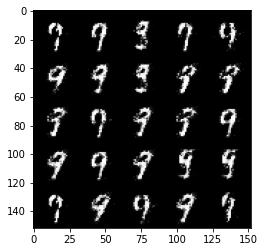

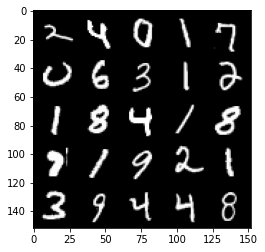

Epoch 2, step 1000: Generator loss: 4.79591206598282, discriminator loss: 0.057107627472840254


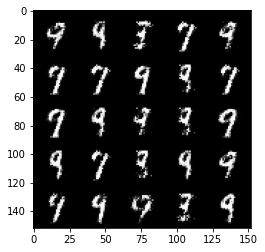

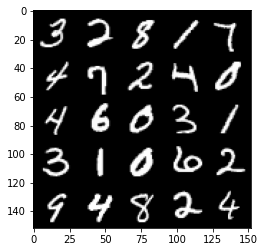

Epoch 3, step 1500: Generator loss: 4.76700627851486, discriminator loss: 0.05237845988664772


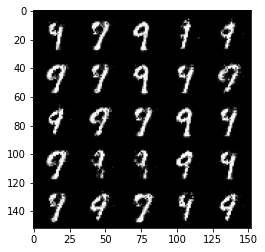

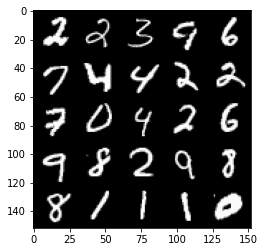

Epoch 4, step 2000: Generator loss: 4.6501950011253355, discriminator loss: 0.05968126497045157


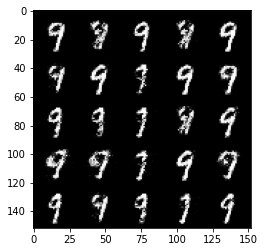

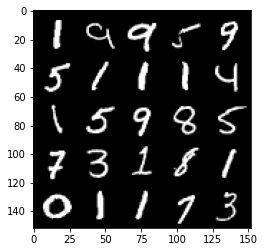

Epoch 5, step 2500: Generator loss: 4.582988334655759, discriminator loss: 0.0582317583430558


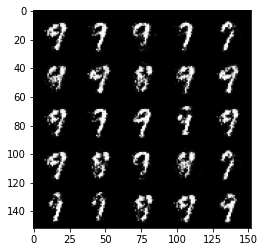

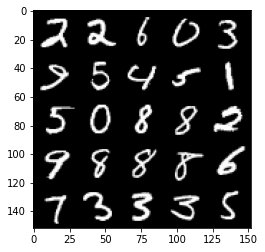

Epoch 6, step 3000: Generator loss: 4.679266434669495, discriminator loss: 0.05264778533577918


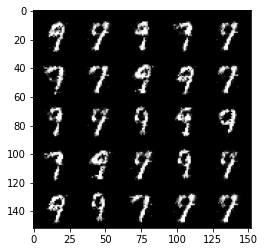

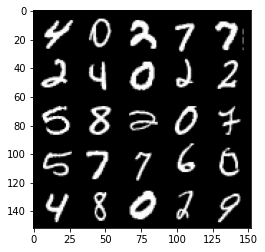

Epoch 7, step 3500: Generator loss: 4.838782606601713, discriminator loss: 0.057354842869564895


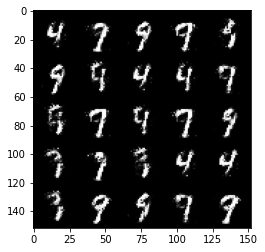

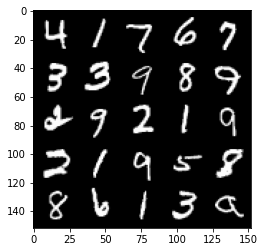

Epoch 8, step 4000: Generator loss: 4.574030079364775, discriminator loss: 0.05952159749343994


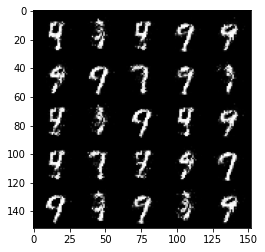

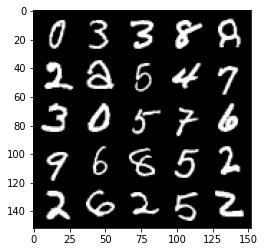

Epoch 9, step 4500: Generator loss: 4.662128618240353, discriminator loss: 0.06208720629476007


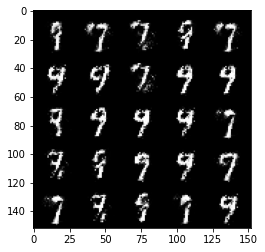

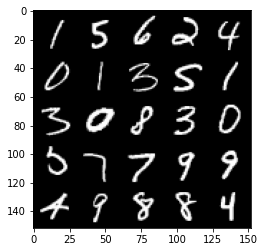

Epoch 10, step 5000: Generator loss: 4.344167829990387, discriminator loss: 0.06905865319445725


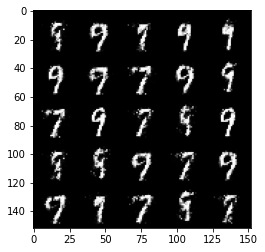

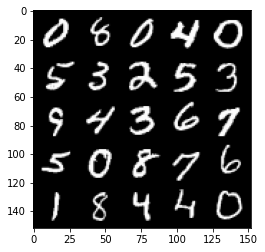

Epoch 11, step 5500: Generator loss: 4.392840849876405, discriminator loss: 0.08138578486815086


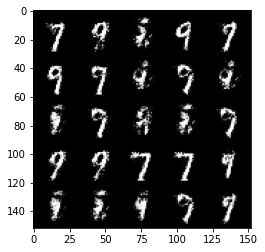

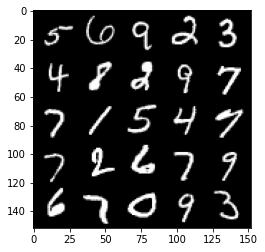

Epoch 12, step 6000: Generator loss: 4.202564120292662, discriminator loss: 0.08570293062180284


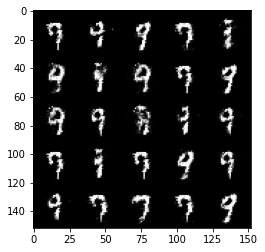

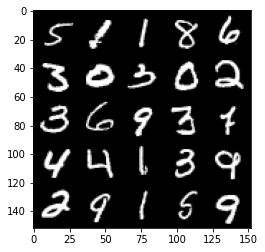

Epoch 13, step 6500: Generator loss: 4.186797276496886, discriminator loss: 0.07004998059384528


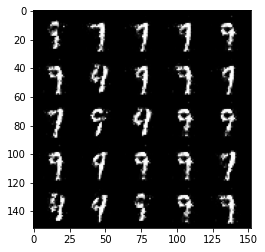

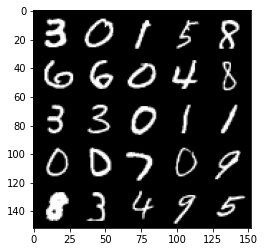

Epoch 14, step 7000: Generator loss: 4.229429542064665, discriminator loss: 0.06826850004121658


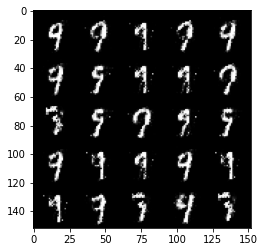

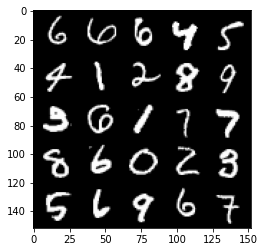

Epoch 15, step 7500: Generator loss: 4.281037811756133, discriminator loss: 0.07166719747893516


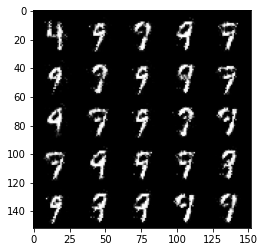

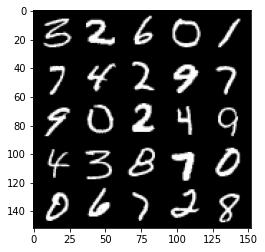

Epoch 17, step 8000: Generator loss: 4.319409010410311, discriminator loss: 0.06786834527738392


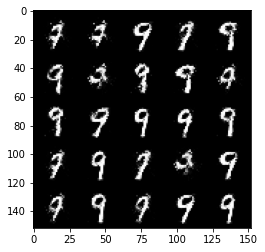

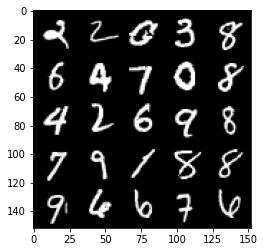

Epoch 18, step 8500: Generator loss: 4.134978000164033, discriminator loss: 0.07653193724527957


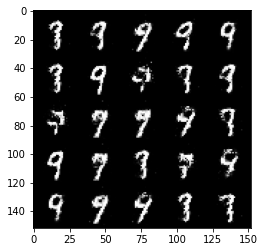

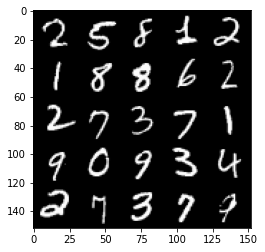

Epoch 19, step 9000: Generator loss: 4.198003869056706, discriminator loss: 0.07538173956423999


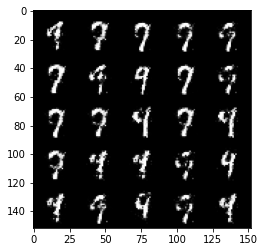

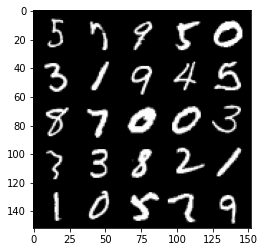

Epoch 20, step 9500: Generator loss: 3.9593392052650467, discriminator loss: 0.08714252888783808


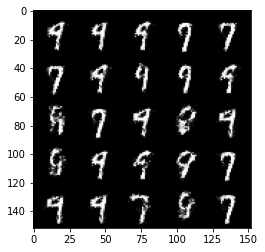

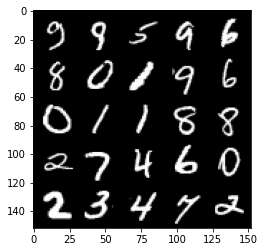

Epoch 21, step 10000: Generator loss: 4.043982488155364, discriminator loss: 0.08083637569472192


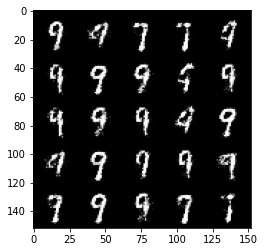

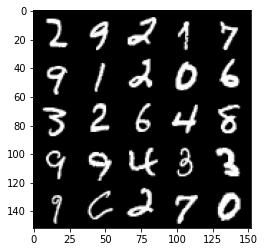

Epoch 22, step 10500: Generator loss: 3.945457593917847, discriminator loss: 0.09051593438535932


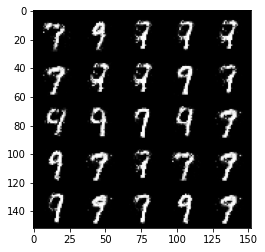

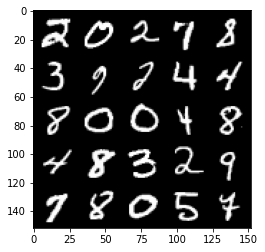

Epoch 23, step 11000: Generator loss: 3.7868646368980396, discriminator loss: 0.09401826648414136


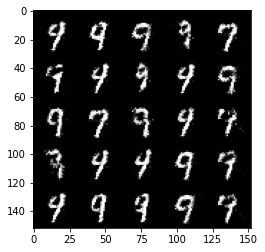

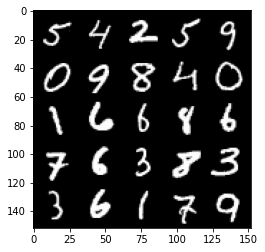

Epoch 24, step 11500: Generator loss: 3.685171647548676, discriminator loss: 0.10456387192383407


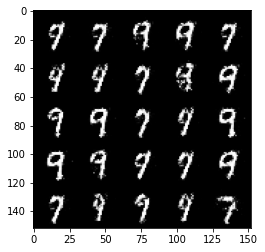

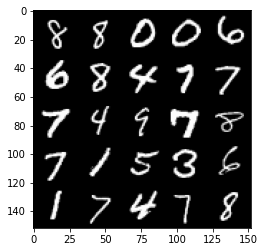

Epoch 25, step 12000: Generator loss: 3.8757433037757862, discriminator loss: 0.08890974163636561


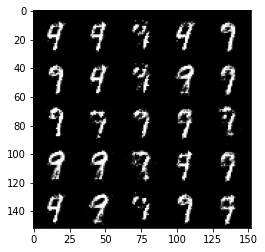

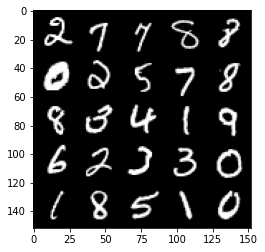

Epoch 26, step 12500: Generator loss: 3.649977747917178, discriminator loss: 0.1056762812957168


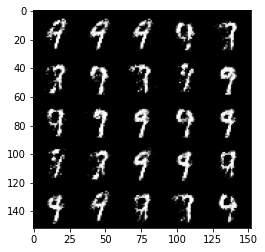

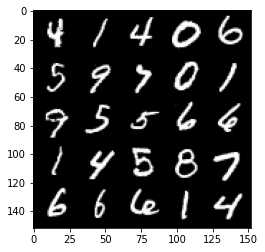

Epoch 27, step 13000: Generator loss: 3.9676129155158977, discriminator loss: 0.07723465582728392


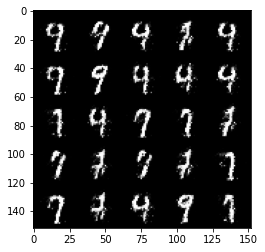

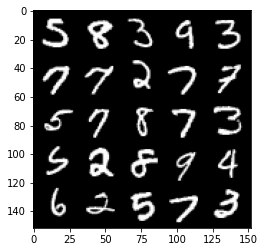

Epoch 28, step 13500: Generator loss: 3.9515355534553542, discriminator loss: 0.08234988142549994


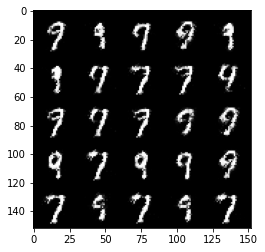

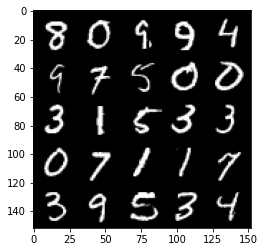

Epoch 29, step 14000: Generator loss: 3.9853348355293283, discriminator loss: 0.07684925405122332


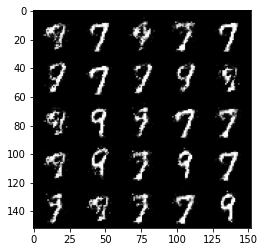

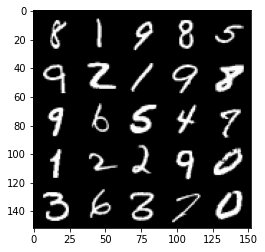

Epoch 30, step 14500: Generator loss: 3.914218216419221, discriminator loss: 0.09137048184871663


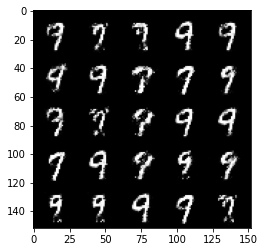

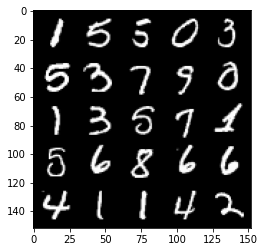

Epoch 31, step 15000: Generator loss: 3.616063864231108, discriminator loss: 0.1032189755626023


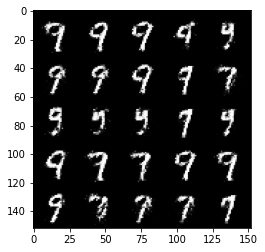

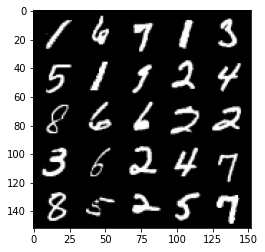

Epoch 33, step 15500: Generator loss: 3.6289306354522677, discriminator loss: 0.10721372234821322


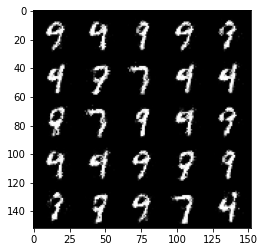

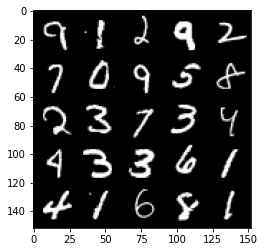

Epoch 34, step 16000: Generator loss: 3.531172338485717, discriminator loss: 0.10182965297996996


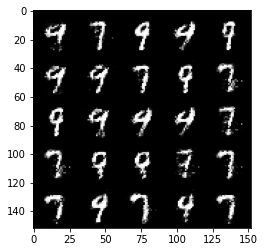

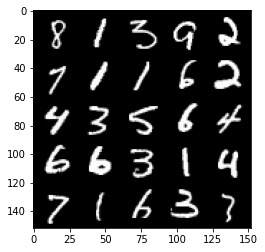

Epoch 35, step 16500: Generator loss: 3.450969545841215, discriminator loss: 0.11424654524028303


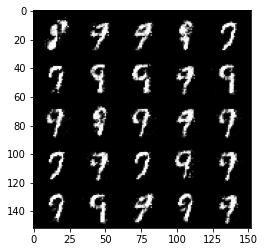

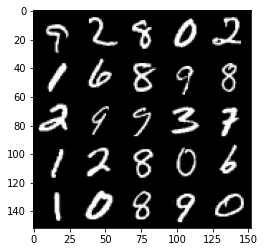

Epoch 36, step 17000: Generator loss: 3.569771238327025, discriminator loss: 0.09928651552647352


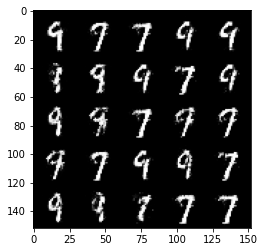

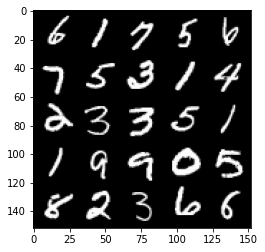

Epoch 37, step 17500: Generator loss: 3.6763028969764693, discriminator loss: 0.08758519997820255


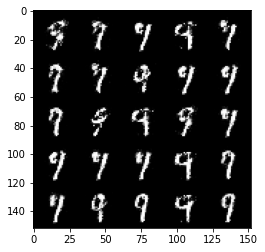

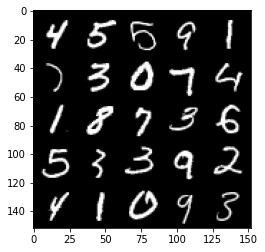

Epoch 38, step 18000: Generator loss: 3.81171450471878, discriminator loss: 0.08644155609235171


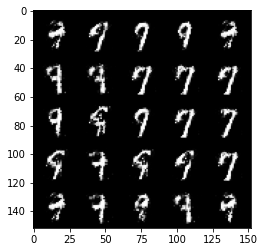

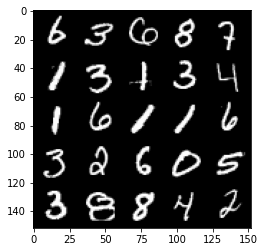

Epoch 39, step 18500: Generator loss: 3.6059519882202142, discriminator loss: 0.10837095964699987


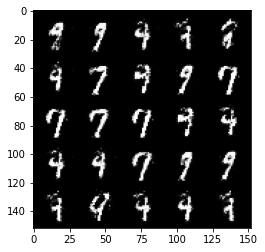

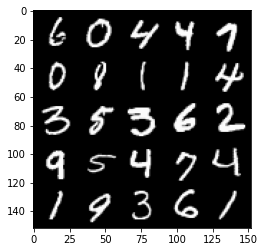

Epoch 40, step 19000: Generator loss: 3.5720752263069127, discriminator loss: 0.1038824070394039


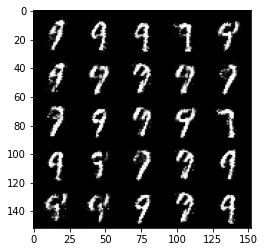

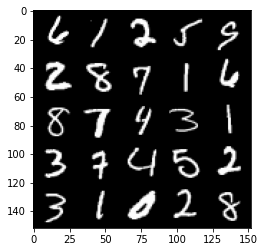

Epoch 41, step 19500: Generator loss: 3.407038964748382, discriminator loss: 0.10809134615212689


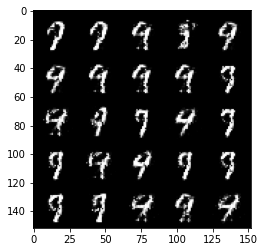

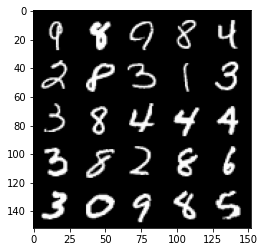

Epoch 42, step 20000: Generator loss: 3.781941258430481, discriminator loss: 0.0923309666775167


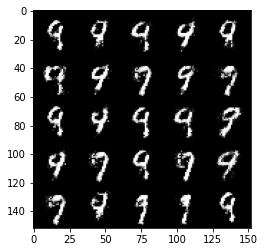

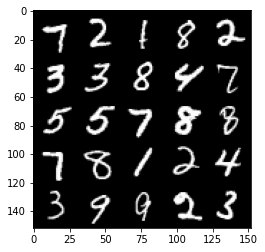

Epoch 43, step 20500: Generator loss: 3.710608204841617, discriminator loss: 0.09157482820749281


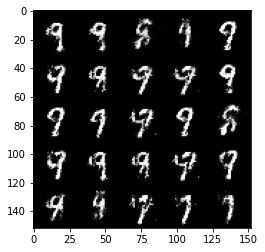

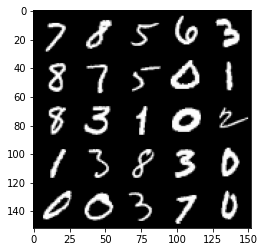

Epoch 44, step 21000: Generator loss: 3.4173123383522057, discriminator loss: 0.11858420456945905


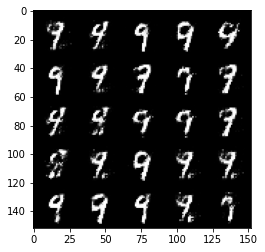

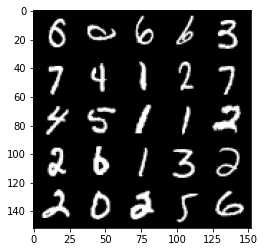

Epoch 45, step 21500: Generator loss: 3.478330360889434, discriminator loss: 0.10487575246393682


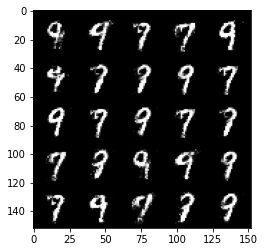

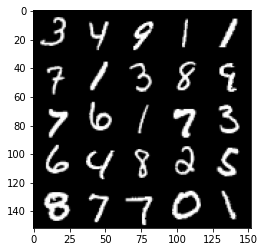

Epoch 46, step 22000: Generator loss: 3.3763625707626335, discriminator loss: 0.11600552551448345


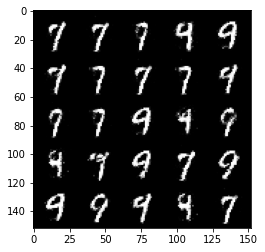

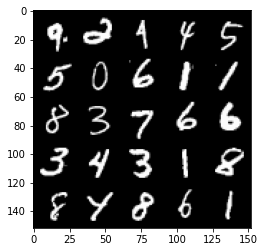

Epoch 47, step 22500: Generator loss: 3.372479723453523, discriminator loss: 0.10923660881817342


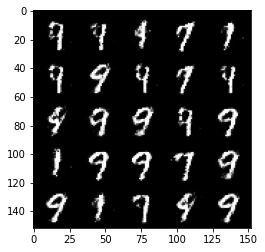

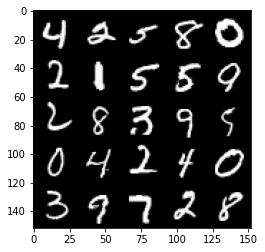

Epoch 49, step 23000: Generator loss: 3.433949767589572, discriminator loss: 0.10355922603979704


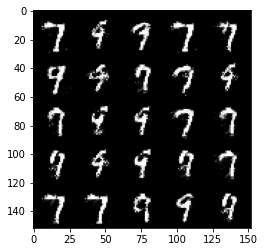

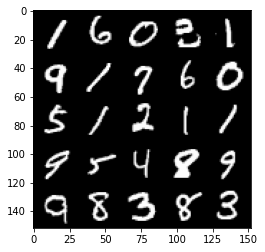

Epoch 50, step 23500: Generator loss: 3.22690085983276, discriminator loss: 0.1280588134117424


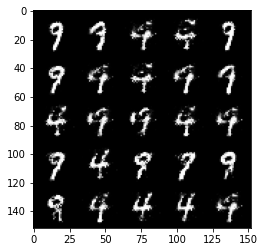

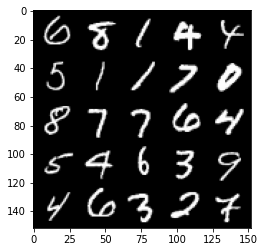

Epoch 51, step 24000: Generator loss: 3.376959374427797, discriminator loss: 0.11517055374011394


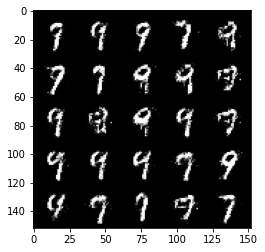

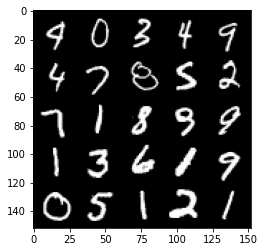

Epoch 52, step 24500: Generator loss: 3.361841082572937, discriminator loss: 0.11952848251909014


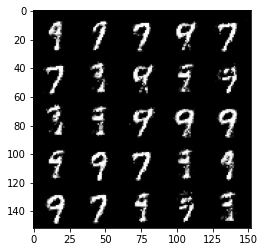

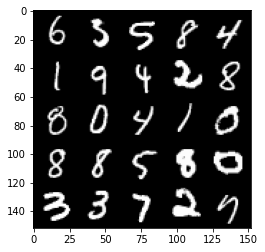

Epoch 53, step 25000: Generator loss: 3.2632653551101676, discriminator loss: 0.11413282306492317


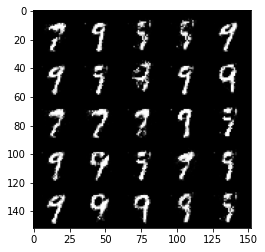

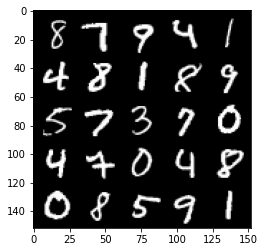

Epoch 54, step 25500: Generator loss: 3.319175137519835, discriminator loss: 0.11310334194451571


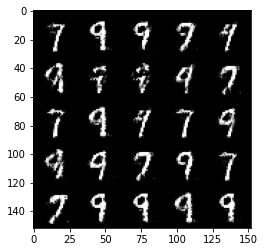

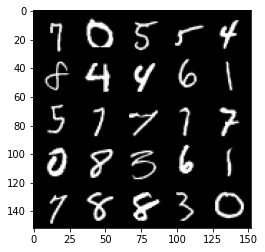

Epoch 55, step 26000: Generator loss: 3.256490530490873, discriminator loss: 0.11197186553478249


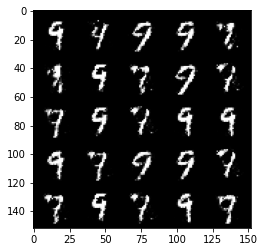

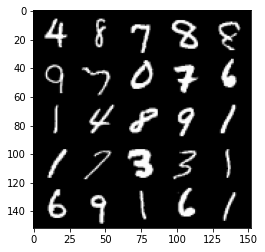

Epoch 56, step 26500: Generator loss: 3.4692504734993017, discriminator loss: 0.10058825695142148


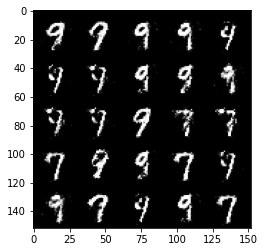

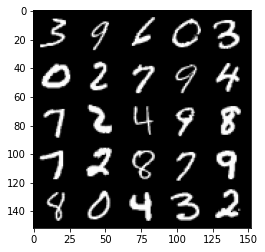

Epoch 57, step 27000: Generator loss: 3.2823912887573226, discriminator loss: 0.12705201753228892


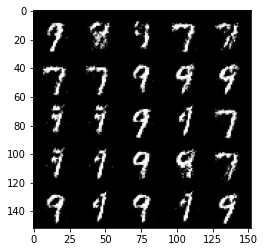

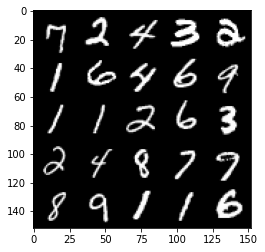

Epoch 58, step 27500: Generator loss: 3.269663198947906, discriminator loss: 0.11729561404883868


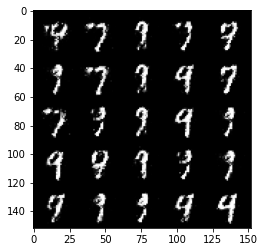

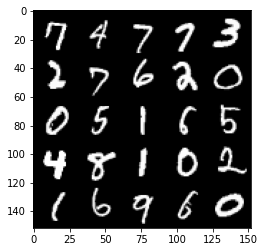

Epoch 59, step 28000: Generator loss: 3.482644057750699, discriminator loss: 0.10472108435630796


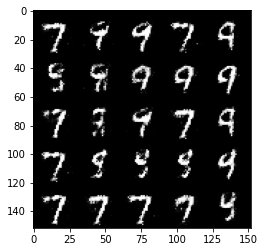

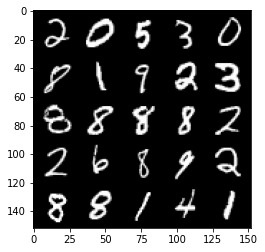

Epoch 60, step 28500: Generator loss: 3.372808546543121, discriminator loss: 0.10638922115415332


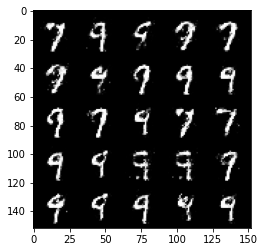

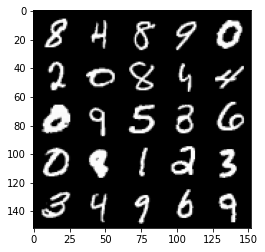

Epoch 61, step 29000: Generator loss: 3.238312608242034, discriminator loss: 0.12497204863280059


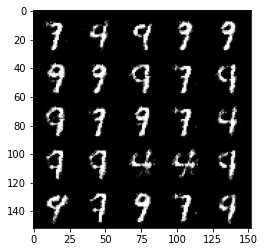

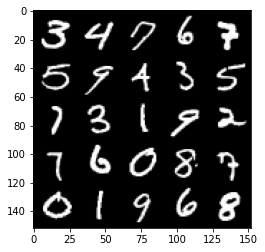

Epoch 62, step 29500: Generator loss: 3.351473073482515, discriminator loss: 0.1113082777559757


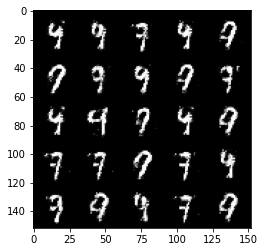

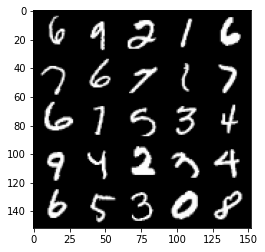

Epoch 63, step 30000: Generator loss: 3.132245617389678, discriminator loss: 0.12875518267601732


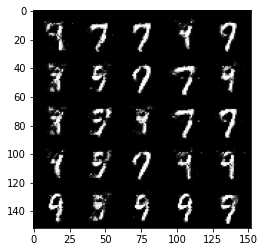

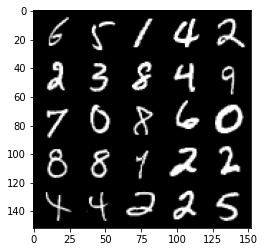

Epoch 65, step 30500: Generator loss: 3.150132625579836, discriminator loss: 0.12755982618033893


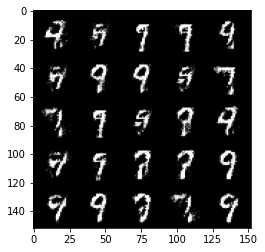

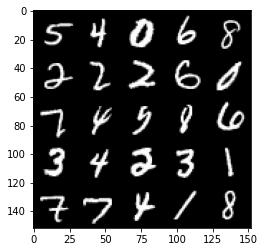

Epoch 66, step 31000: Generator loss: 3.2077446427345278, discriminator loss: 0.12535488304495823


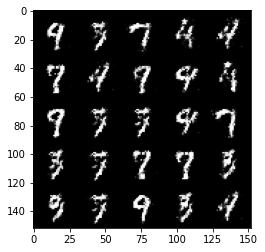

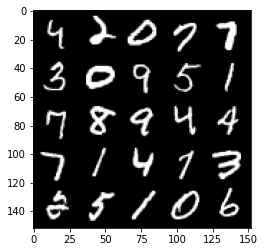

Epoch 67, step 31500: Generator loss: 3.274144246578218, discriminator loss: 0.11699665276706224


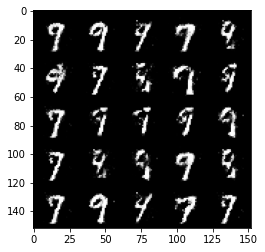

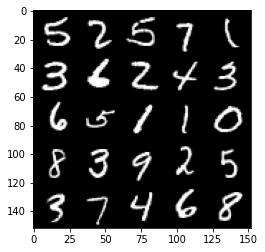

Epoch 68, step 32000: Generator loss: 3.2271230516433738, discriminator loss: 0.12566082005947826


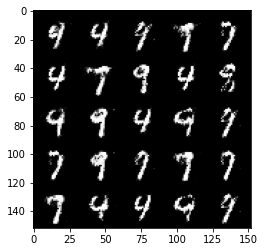

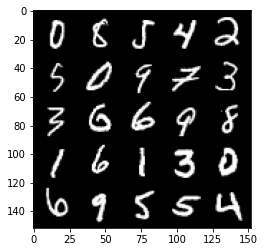

Epoch 69, step 32500: Generator loss: 3.0103686671257033, discriminator loss: 0.1355266796797513


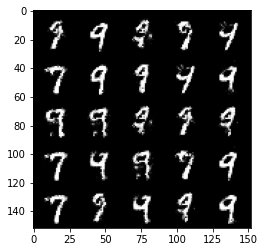

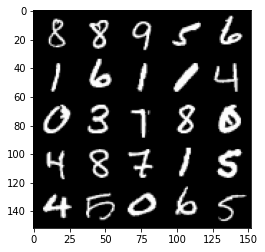

Epoch 70, step 33000: Generator loss: 3.0068334622383093, discriminator loss: 0.14669202147424218


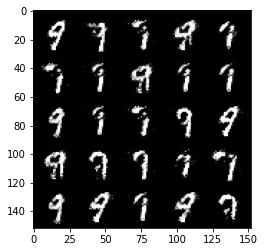

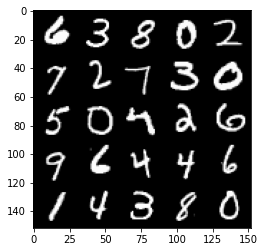

Epoch 71, step 33500: Generator loss: 3.1238450551033003, discriminator loss: 0.12003278357535606


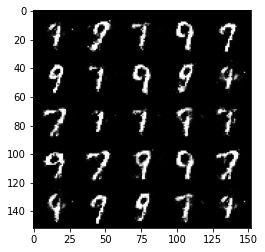

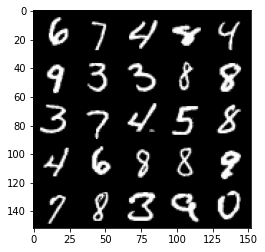

Epoch 72, step 34000: Generator loss: 2.9071677160263056, discriminator loss: 0.15244449247419828


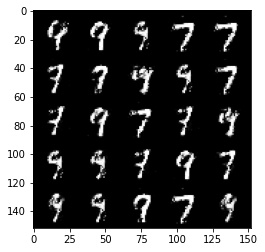

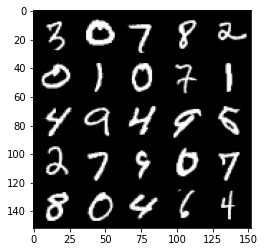

Epoch 73, step 34500: Generator loss: 3.1117284245491015, discriminator loss: 0.12820278023183343


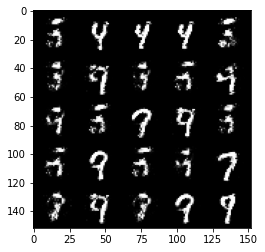

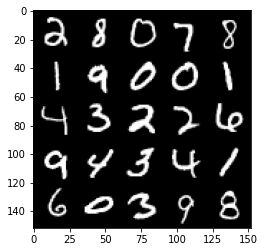

Epoch 74, step 35000: Generator loss: 3.0692591471672075, discriminator loss: 0.13170509475469594


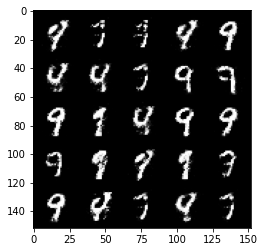

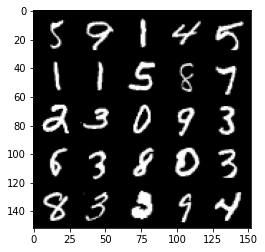

Epoch 75, step 35500: Generator loss: 3.010711391925809, discriminator loss: 0.13501377883553495


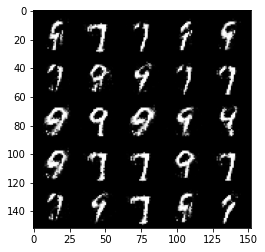

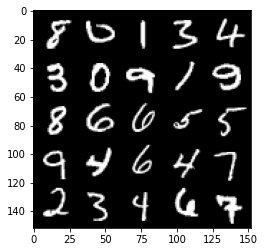

Epoch 76, step 36000: Generator loss: 2.989184898853304, discriminator loss: 0.1374881669953465


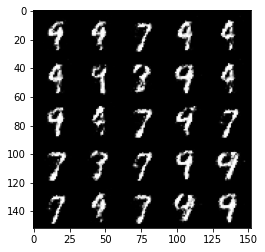

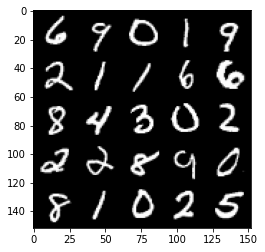

Epoch 77, step 36500: Generator loss: 2.8114726071357743, discriminator loss: 0.15141422908008093


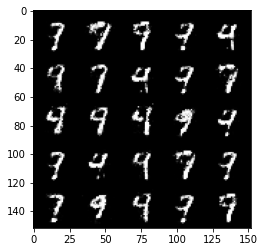

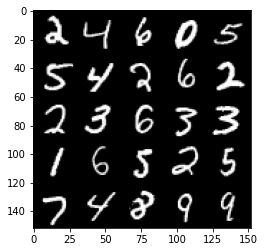

Epoch 78, step 37000: Generator loss: 2.936570222377776, discriminator loss: 0.14787908889353268


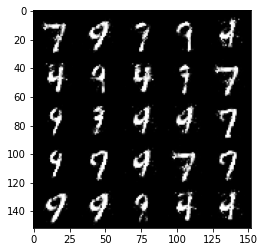

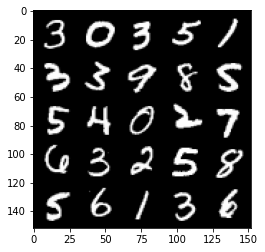

Epoch 79, step 37500: Generator loss: 2.9134886083602898, discriminator loss: 0.14404559759795674


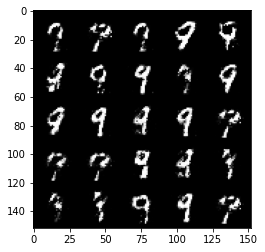

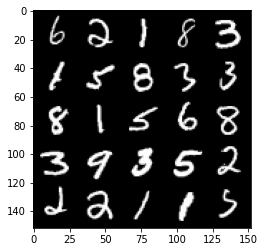

Epoch 81, step 38000: Generator loss: 2.7212859253883375, discriminator loss: 0.16401907639205465


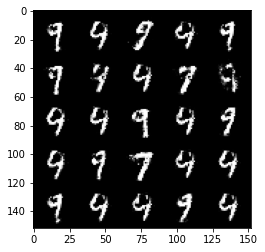

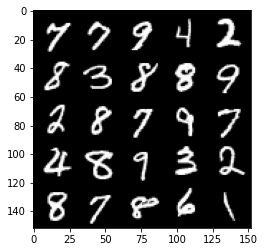

Epoch 82, step 38500: Generator loss: 2.888626972198484, discriminator loss: 0.14589327488839637


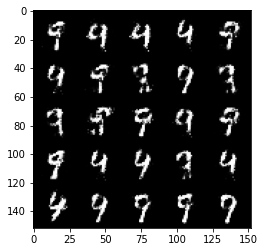

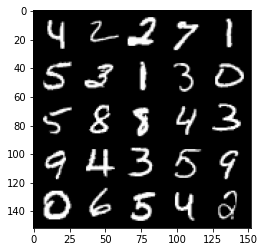

Epoch 83, step 39000: Generator loss: 3.126390903949738, discriminator loss: 0.12100893513858321


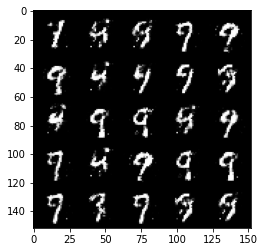

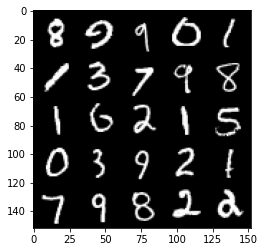

Epoch 84, step 39500: Generator loss: 3.19754027700424, discriminator loss: 0.12515854265540832


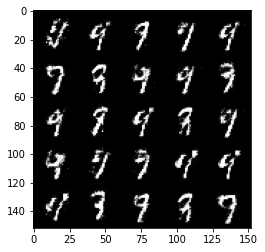

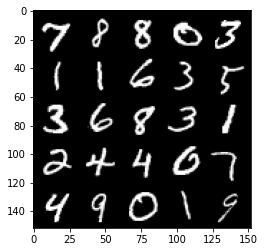

Epoch 85, step 40000: Generator loss: 2.894174172401428, discriminator loss: 0.14674538131803275


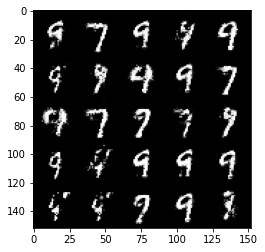

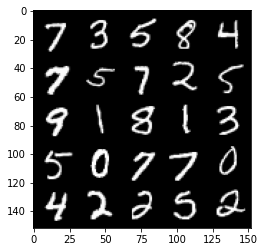

Epoch 86, step 40500: Generator loss: 2.8088905344009363, discriminator loss: 0.16160054932534684


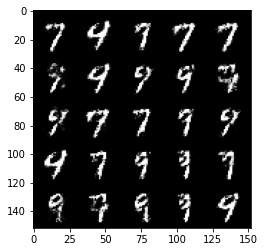

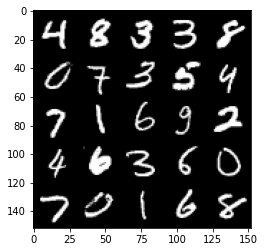

Epoch 87, step 41000: Generator loss: 2.7462952704429604, discriminator loss: 0.15887833479046826


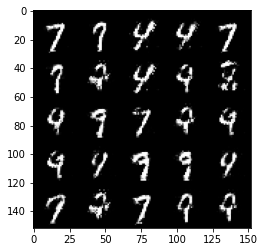

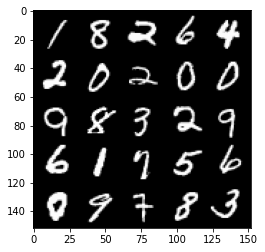

Epoch 88, step 41500: Generator loss: 2.8371810336112953, discriminator loss: 0.15078117917478073


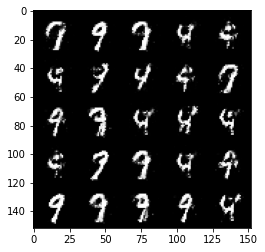

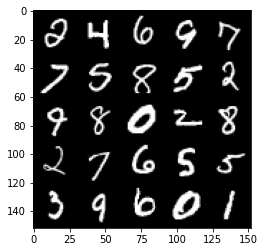

Epoch 89, step 42000: Generator loss: 2.844606646060944, discriminator loss: 0.1454344759434462


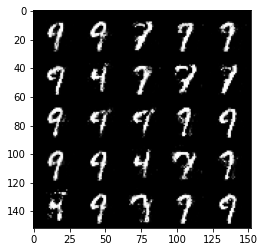

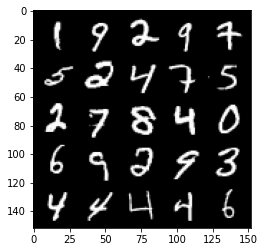

Epoch 90, step 42500: Generator loss: 2.8701664528846726, discriminator loss: 0.14550268036872158


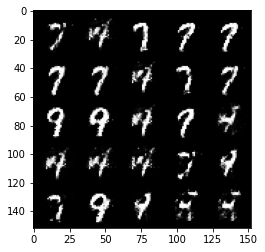

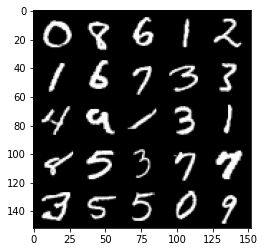

Epoch 91, step 43000: Generator loss: 2.6701940703392006, discriminator loss: 0.17276370638608943


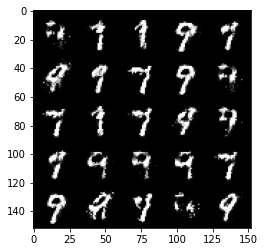

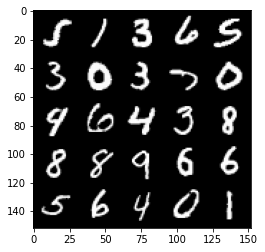

Epoch 92, step 43500: Generator loss: 2.895251549720765, discriminator loss: 0.14082350834459043


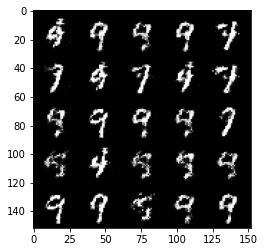

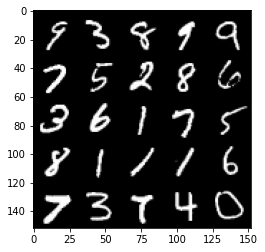

Epoch 93, step 44000: Generator loss: 2.9692472033500676, discriminator loss: 0.14335072942078117


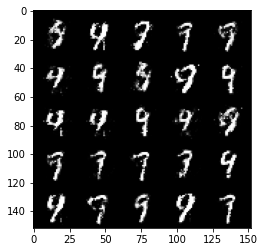

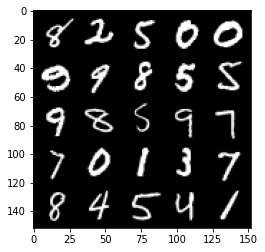

Epoch 94, step 44500: Generator loss: 2.950425953388211, discriminator loss: 0.13906388400495043


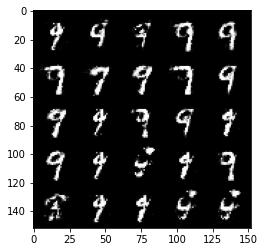

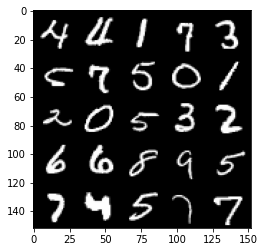

Epoch 95, step 45000: Generator loss: 2.924269560337068, discriminator loss: 0.14081820265203712


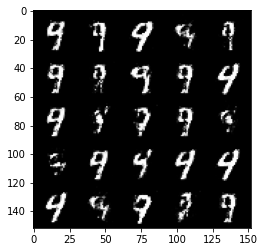

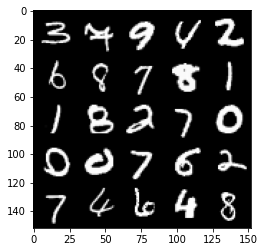

Epoch 97, step 45500: Generator loss: 2.743432824611664, discriminator loss: 0.15690288129448893


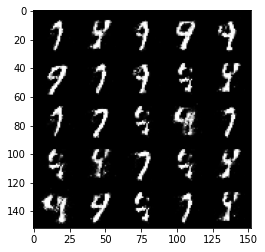

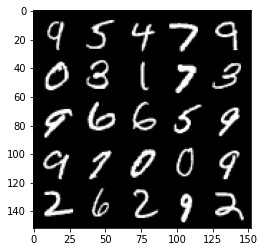

Epoch 98, step 46000: Generator loss: 2.850881632328034, discriminator loss: 0.14400637935101995


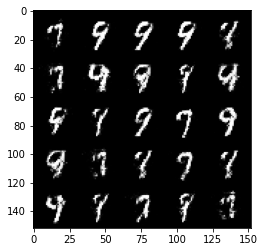

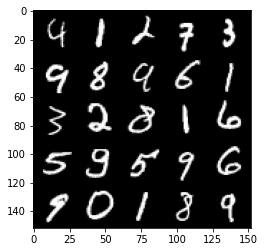

Epoch 99, step 46500: Generator loss: 2.706372980594634, discriminator loss: 0.16216600410640256


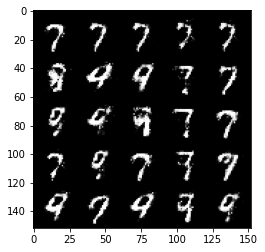

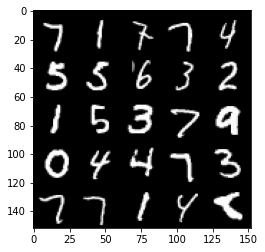

Epoch 100, step 47000: Generator loss: 2.97544061088562, discriminator loss: 0.14197446169704214


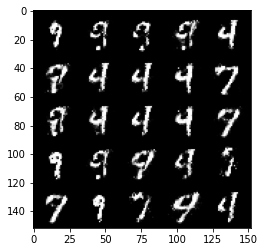

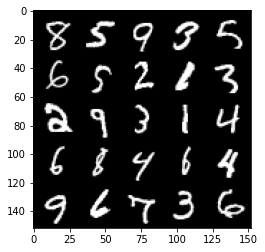

Epoch 101, step 47500: Generator loss: 2.82284053373337, discriminator loss: 0.15395842646062385


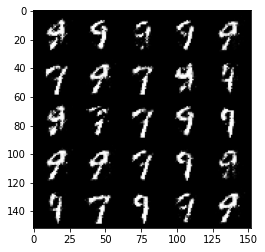

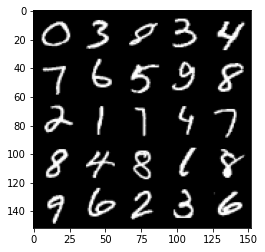

Epoch 102, step 48000: Generator loss: 2.7891899132728586, discriminator loss: 0.16455403274297714


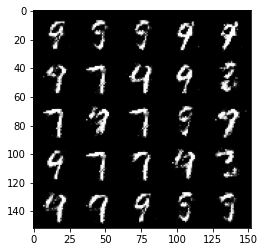

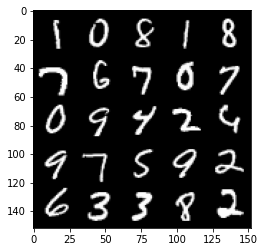

Epoch 103, step 48500: Generator loss: 2.6866208658218347, discriminator loss: 0.16808561359345914


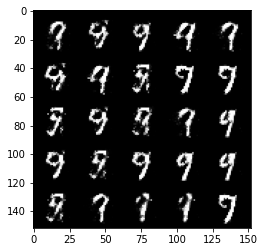

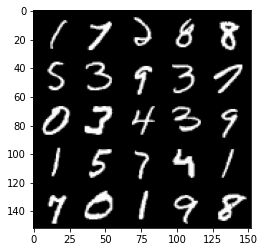

Epoch 104, step 49000: Generator loss: 2.634437236309049, discriminator loss: 0.16974067626893516


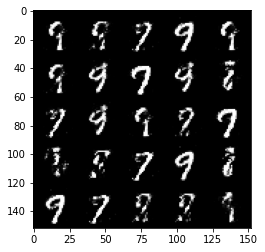

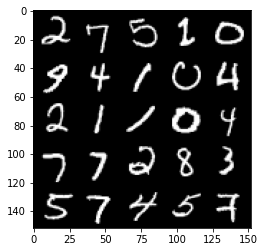

Epoch 105, step 49500: Generator loss: 2.7782543721199024, discriminator loss: 0.15479705247282968


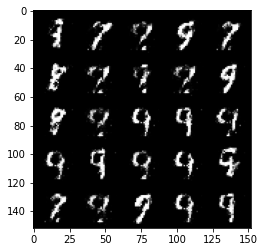

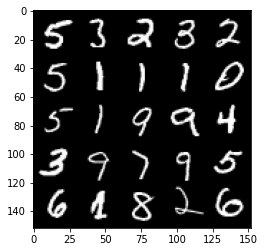

Epoch 106, step 50000: Generator loss: 2.7152710642814637, discriminator loss: 0.16082840809226046


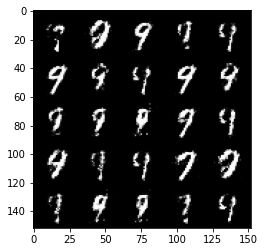

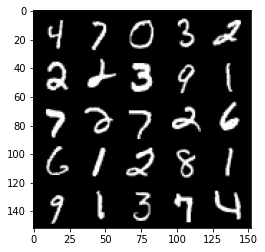

Epoch 107, step 50500: Generator loss: 2.741842771053315, discriminator loss: 0.16012764537334434


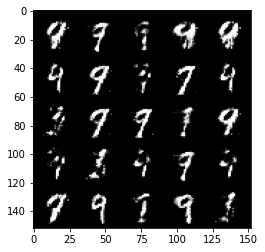

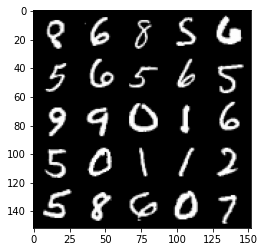

Epoch 108, step 51000: Generator loss: 2.5348009052276628, discriminator loss: 0.18252209918200984


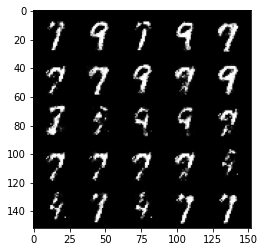

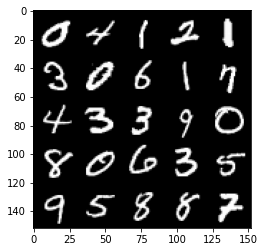

Epoch 109, step 51500: Generator loss: 2.67098711061478, discriminator loss: 0.15980264896154403


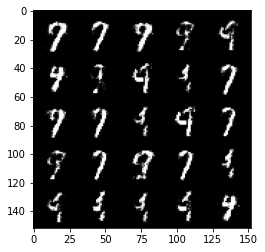

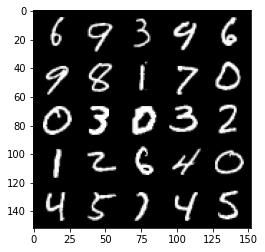

Epoch 110, step 52000: Generator loss: 2.8999365487098685, discriminator loss: 0.14645886158943186


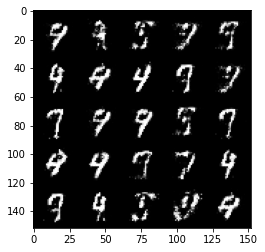

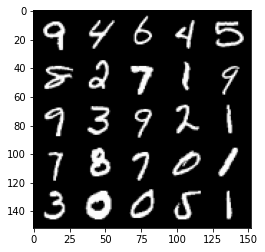

Epoch 111, step 52500: Generator loss: 2.8040215678215037, discriminator loss: 0.16247480438649645


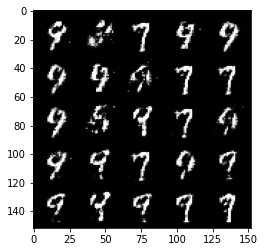

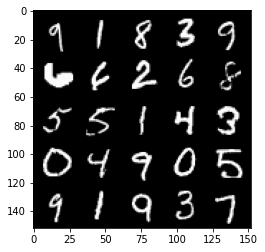

Epoch 113, step 53000: Generator loss: 2.5766400828361506, discriminator loss: 0.19547356185317039


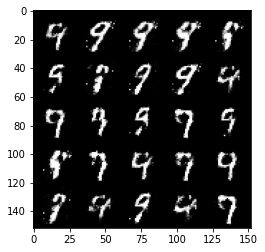

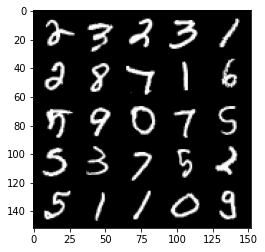

Epoch 114, step 53500: Generator loss: 2.664308902263642, discriminator loss: 0.17109533321857448


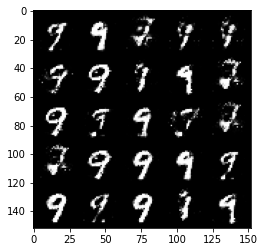

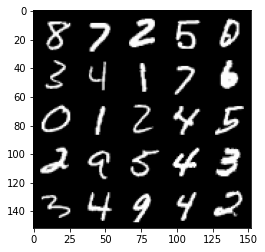

Epoch 115, step 54000: Generator loss: 2.5176734914779657, discriminator loss: 0.1823921194672584


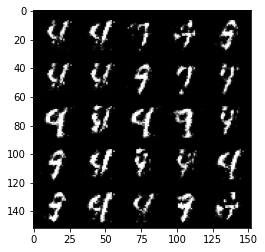

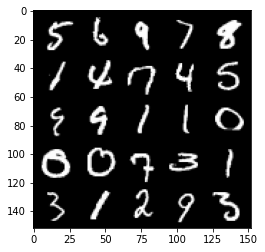

Epoch 116, step 54500: Generator loss: 2.7692784013748173, discriminator loss: 0.15926286019384855


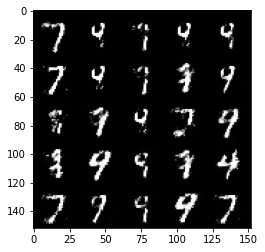

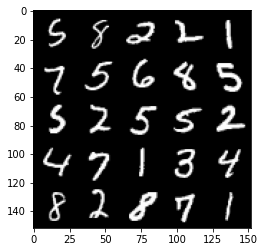

Epoch 117, step 55000: Generator loss: 2.8331268124580387, discriminator loss: 0.155437476463616


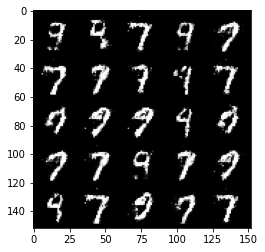

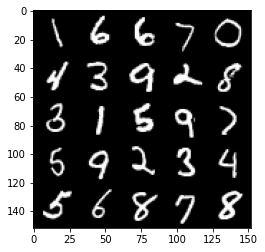

Epoch 118, step 55500: Generator loss: 2.8467743277549773, discriminator loss: 0.15458088670670989


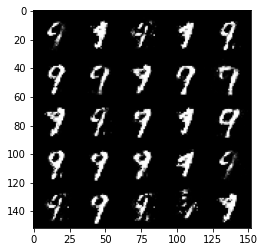

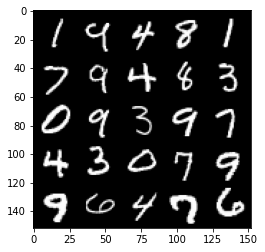

Epoch 119, step 56000: Generator loss: 2.8291729907989502, discriminator loss: 0.1541717617735267


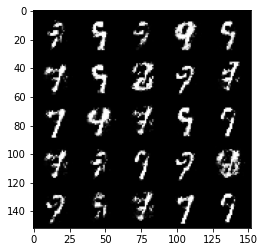

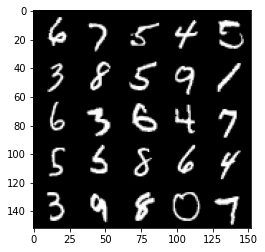

Epoch 120, step 56500: Generator loss: 2.6957658500671404, discriminator loss: 0.1652552355751396


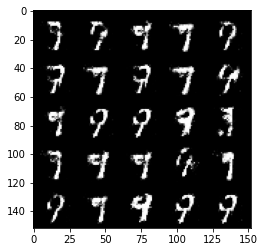

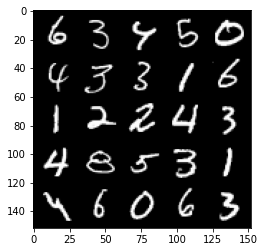

Epoch 121, step 57000: Generator loss: 2.794222055912019, discriminator loss: 0.15901043719053265


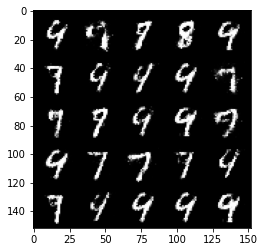

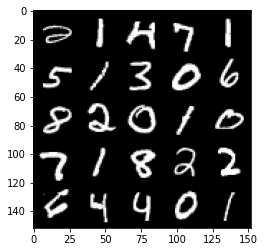

Epoch 122, step 57500: Generator loss: 2.7585248122215287, discriminator loss: 0.15796184484660641


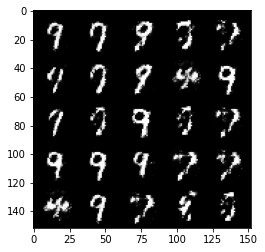

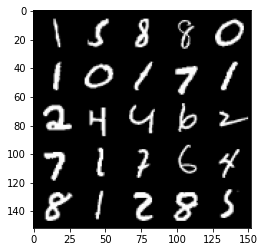

Epoch 123, step 58000: Generator loss: 2.590983277797697, discriminator loss: 0.18525959241390225


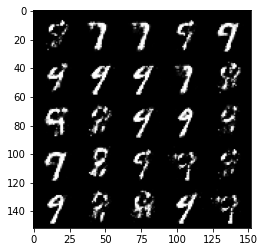

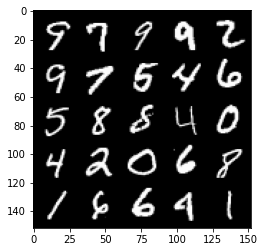

Epoch 124, step 58500: Generator loss: 2.5719783544540396, discriminator loss: 0.17527844487130648


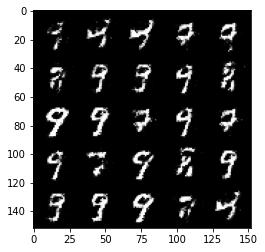

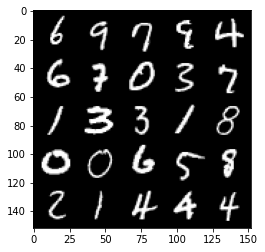

Epoch 125, step 59000: Generator loss: 2.5993399252891525, discriminator loss: 0.1821046040058135


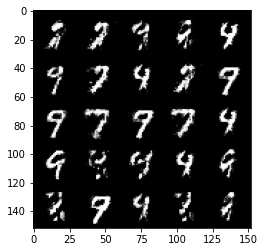

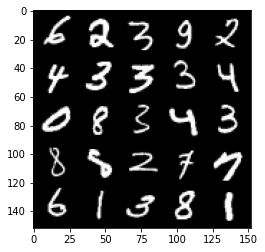

Epoch 126, step 59500: Generator loss: 2.5250860509872433, discriminator loss: 0.18656314384937273


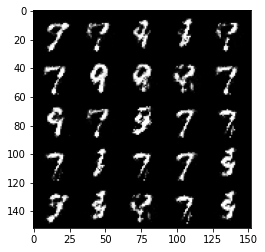

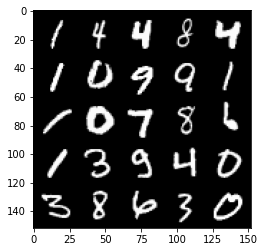

Epoch 127, step 60000: Generator loss: 2.41693196439743, discriminator loss: 0.1937282907217743


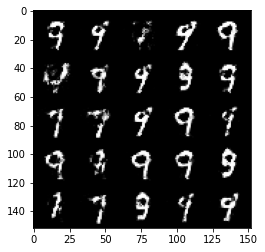

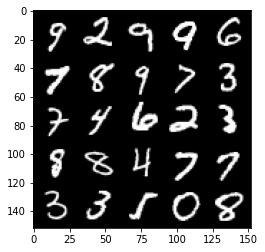

Epoch 128, step 60500: Generator loss: 2.4474656376838713, discriminator loss: 0.1919123593866824


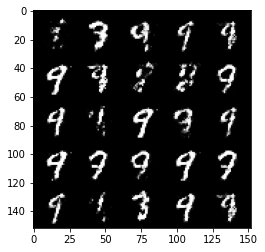

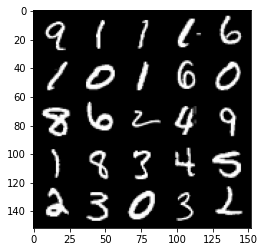

Epoch 130, step 61000: Generator loss: 2.4662135558128386, discriminator loss: 0.19127732458710667


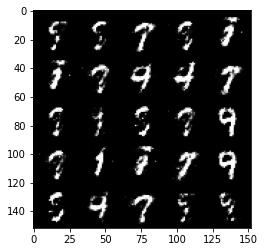

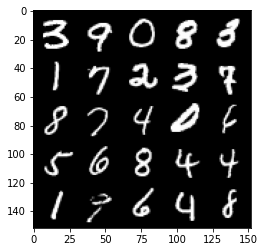

Epoch 131, step 61500: Generator loss: 2.480695126533508, discriminator loss: 0.18750834092497823


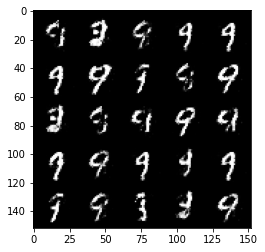

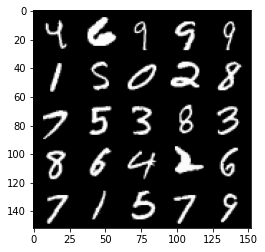

Epoch 132, step 62000: Generator loss: 2.4983608732223512, discriminator loss: 0.19299228380620484


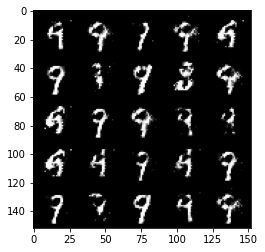

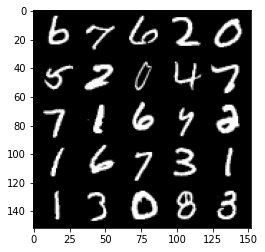

Epoch 133, step 62500: Generator loss: 2.549806671142575, discriminator loss: 0.18289260554313663


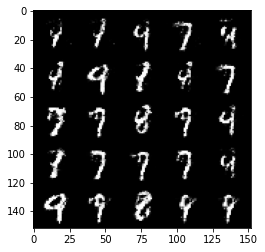

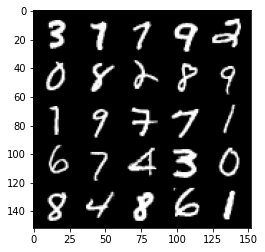

Epoch 134, step 63000: Generator loss: 2.5834908967018095, discriminator loss: 0.18421172250807302


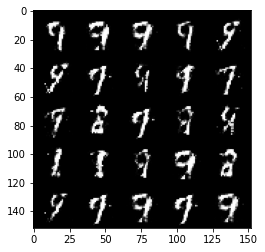

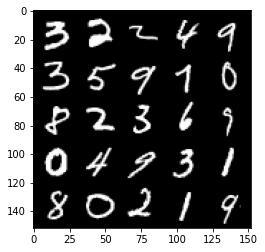

Epoch 135, step 63500: Generator loss: 2.3972571210861218, discriminator loss: 0.20481470191478698


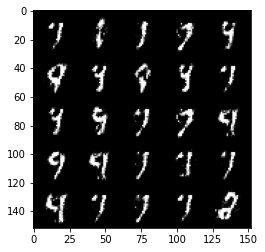

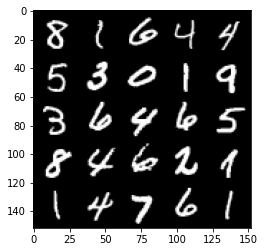

Epoch 136, step 64000: Generator loss: 2.5594503092765803, discriminator loss: 0.17917418617010103


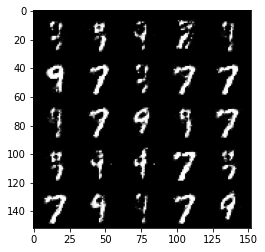

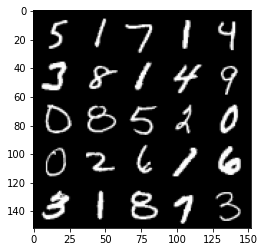

Epoch 137, step 64500: Generator loss: 2.542052082061767, discriminator loss: 0.18173518934845928


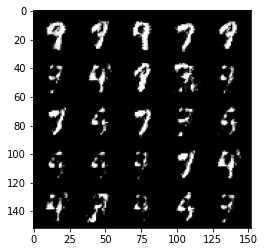

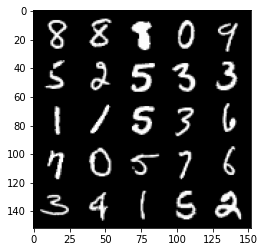

Epoch 138, step 65000: Generator loss: 2.4087561724185944, discriminator loss: 0.19514824856817722


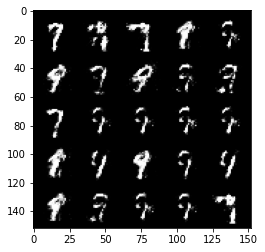

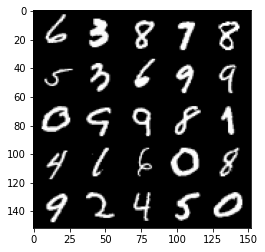

Epoch 139, step 65500: Generator loss: 2.5522935662269592, discriminator loss: 0.1851566346585752


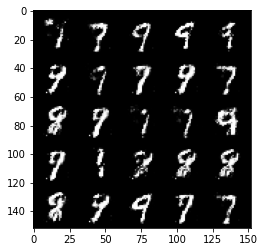

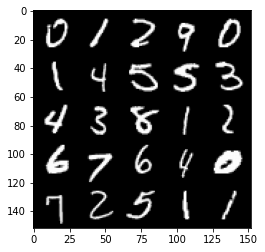

Epoch 140, step 66000: Generator loss: 2.5128945531845086, discriminator loss: 0.18864089548587798


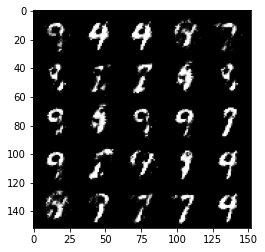

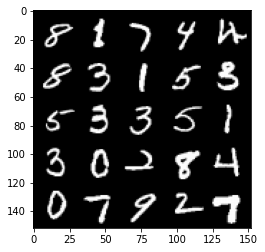

Epoch 141, step 66500: Generator loss: 2.644325481891633, discriminator loss: 0.1778183323591947


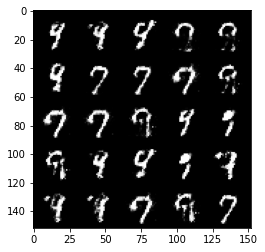

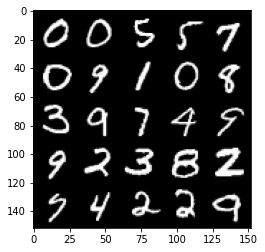

Epoch 142, step 67000: Generator loss: 2.5679361987113944, discriminator loss: 0.18764241547882565


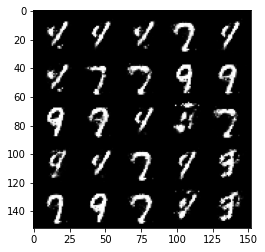

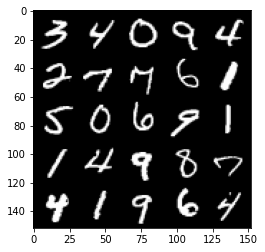

Epoch 143, step 67500: Generator loss: 2.4712654829025262, discriminator loss: 0.2040102117806671


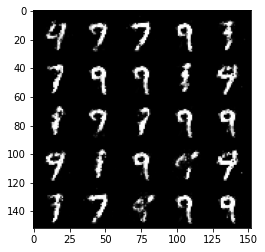

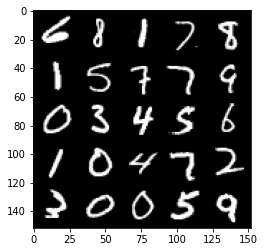

Epoch 144, step 68000: Generator loss: 2.474106226921079, discriminator loss: 0.1987813112288716


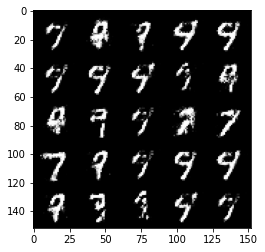

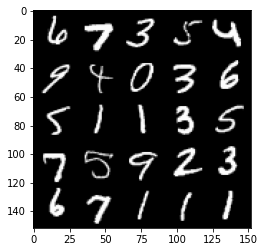

Epoch 146, step 68500: Generator loss: 2.529229832172396, discriminator loss: 0.19033098776638502


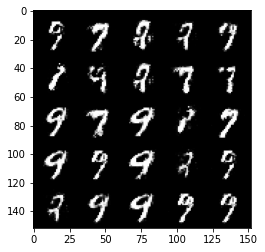

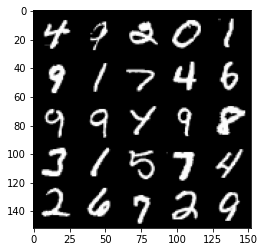

Epoch 147, step 69000: Generator loss: 2.375993035793305, discriminator loss: 0.19677527798712252


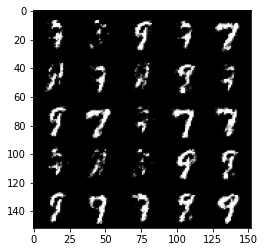

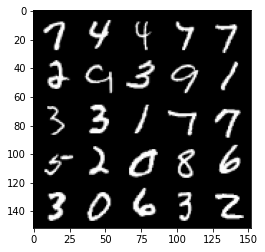

Epoch 148, step 69500: Generator loss: 2.3837593870162985, discriminator loss: 0.19966315715014926


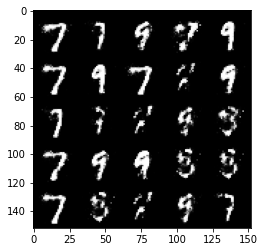

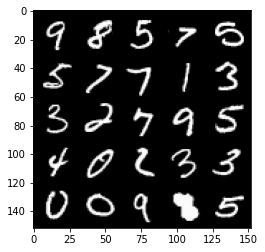

Epoch 149, step 70000: Generator loss: 2.4305650081634536, discriminator loss: 0.1959767532199622


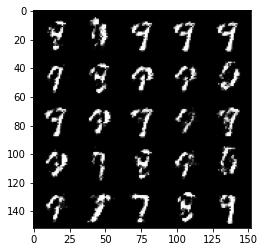

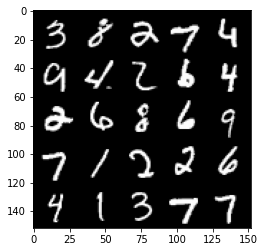

Epoch 150, step 70500: Generator loss: 2.508904803276063, discriminator loss: 0.19261741276085392


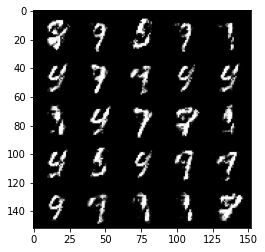

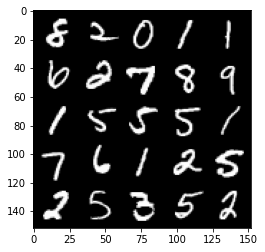

Epoch 151, step 71000: Generator loss: 2.477255966186526, discriminator loss: 0.19256503260135654


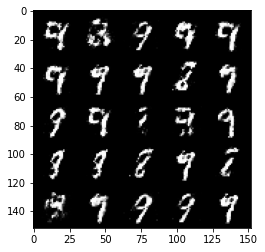

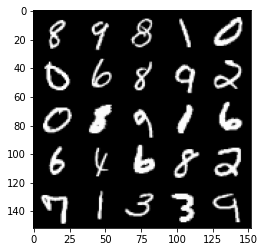

Epoch 152, step 71500: Generator loss: 2.5289316239356996, discriminator loss: 0.182629654198885


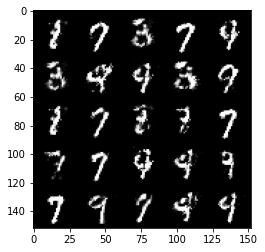

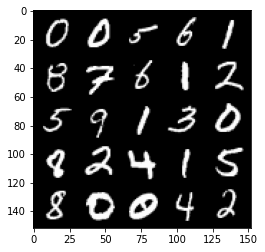

Epoch 153, step 72000: Generator loss: 2.373564508914947, discriminator loss: 0.21014851395785822


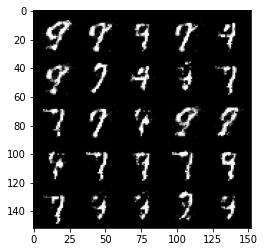

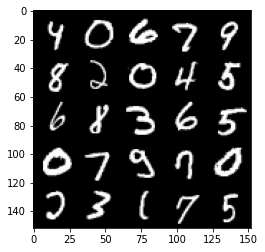

Epoch 154, step 72500: Generator loss: 2.3544266483783716, discriminator loss: 0.20143501442670816


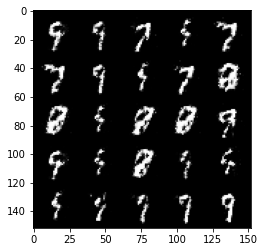

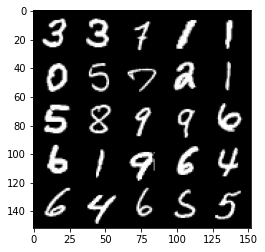

Epoch 155, step 73000: Generator loss: 2.1577432518005377, discriminator loss: 0.23417066349089147


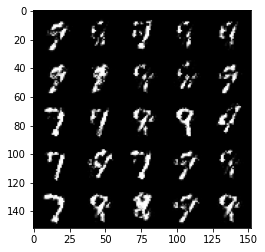

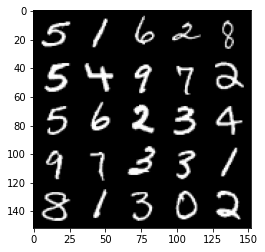

Epoch 156, step 73500: Generator loss: 2.3623858509063727, discriminator loss: 0.21418088574707506


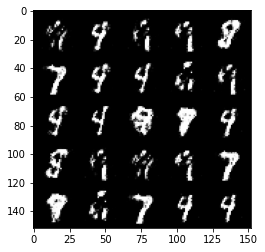

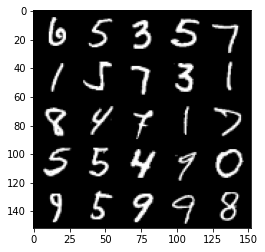

Epoch 157, step 74000: Generator loss: 2.41030668783188, discriminator loss: 0.20142510367929925


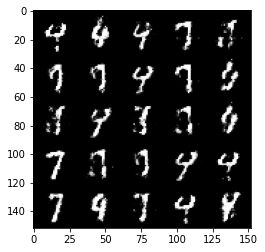

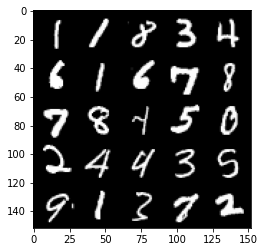

Epoch 158, step 74500: Generator loss: 2.1890632588863377, discriminator loss: 0.2383596644401551


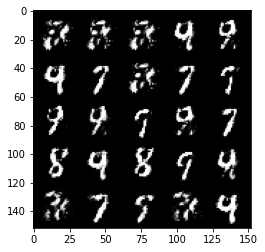

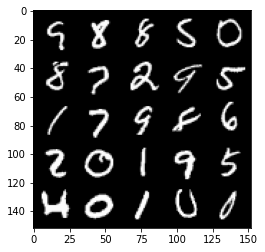

Epoch 159, step 75000: Generator loss: 2.3994168672561655, discriminator loss: 0.2127758063971996


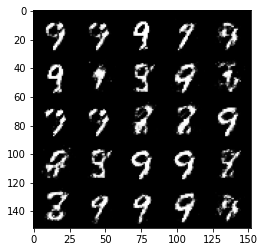

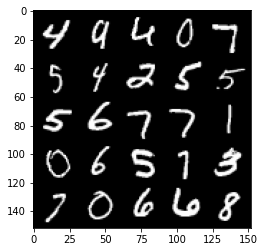

Epoch 160, step 75500: Generator loss: 2.297179977893829, discriminator loss: 0.2187328037023544


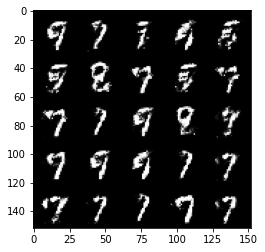

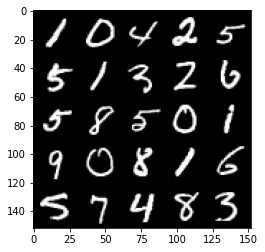

Epoch 162, step 76000: Generator loss: 2.3399856476783754, discriminator loss: 0.21590365117788332


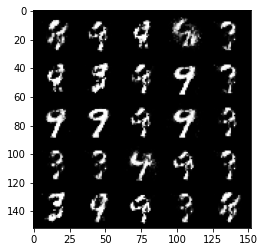

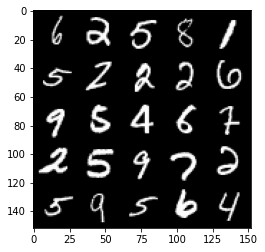

Epoch 163, step 76500: Generator loss: 2.3467392416000368, discriminator loss: 0.22408166441321392


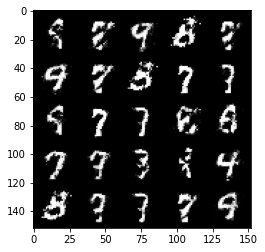

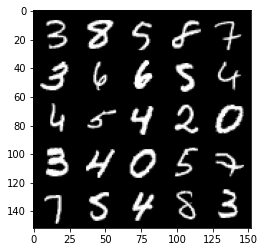

Epoch 164, step 77000: Generator loss: 2.4062155919075, discriminator loss: 0.2215807254612447


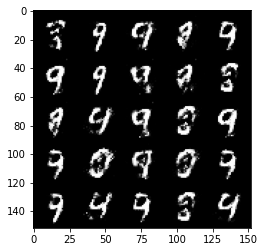

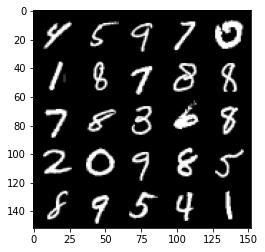

Epoch 165, step 77500: Generator loss: 2.5394915904998787, discriminator loss: 0.1900175628215075


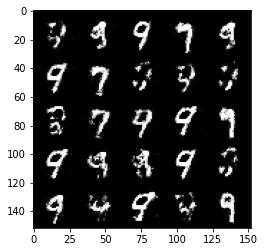

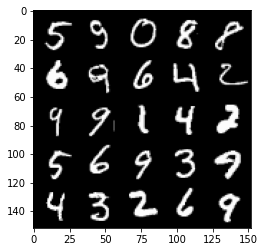

Epoch 166, step 78000: Generator loss: 2.329004428863525, discriminator loss: 0.2148828225284817


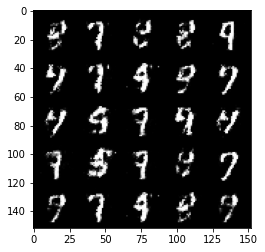

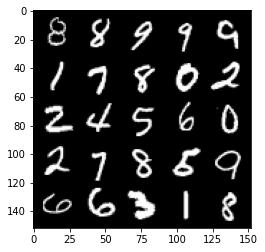

Epoch 167, step 78500: Generator loss: 2.499159799575807, discriminator loss: 0.18547287136316293


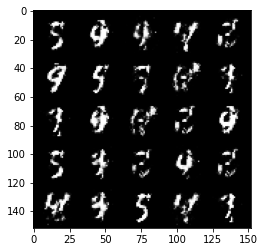

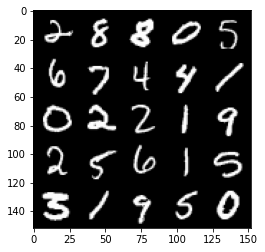

Epoch 168, step 79000: Generator loss: 2.3884236054420476, discriminator loss: 0.19616997975111022


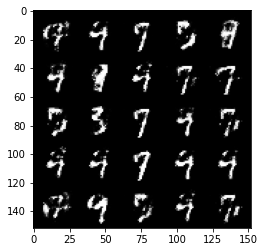

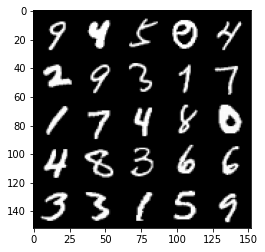

Epoch 169, step 79500: Generator loss: 2.148602152585983, discriminator loss: 0.2447612387686968


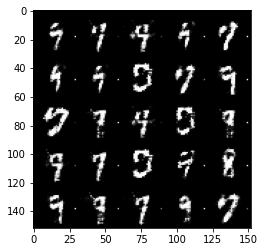

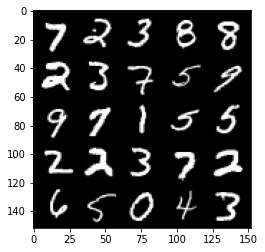

Epoch 170, step 80000: Generator loss: 2.3982193777561176, discriminator loss: 0.2009860274493694


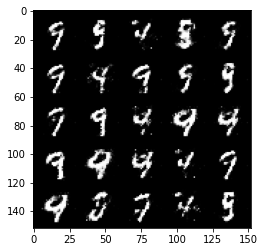

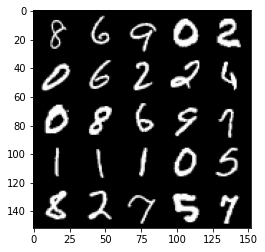

Epoch 171, step 80500: Generator loss: 2.6317276411056545, discriminator loss: 0.18628823910653583


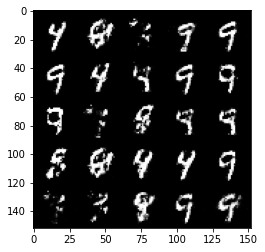

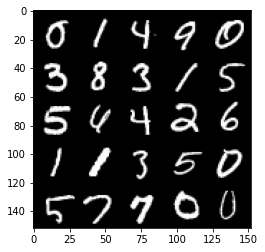

In [ ]:
cur_step = 0
mean_generator_loss = 0
mean_discriminator_loss = 0
test_generator = True
gen_loss = False
error = False

for i in range(n_epochs):
  for real,_ in tqdm(dataloader):
    cur_batch_size = len(real)

    real = real.view(cur_batch_size,-1).to(device)
    disc_opt.zero_grad()
    disc_loss = get_disc_loss(gen, disc, loss_term, real, cur_batch_size, z_dim, device)

    disc_loss.backward(retain_graph=True)
    disc_opt.step()

    gen_opt.zero_grad()
    gen_loss = gen_loss_(gen,disc,loss_term,cur_batch_size,z_dim,device)
    gen_loss.backward(retain_graph=True)
    gen_opt.step()
    mean_discriminator_loss += disc_loss.item() / display_step
    mean_generator_loss += gen_loss.item() / display_step

    if cur_step % display_step == 0 and cur_step > 0:
            print(f"Epoch {i}, step {cur_step}: Generator loss: {mean_generator_loss}, discriminator loss: {mean_discriminator_loss}")
            fake_noise = get_noise_vector(cur_batch_size, z_dim, device=device)
            fake = gen(fake_noise)
            show_tensor_images(fake)
            show_tensor_images(real)
            mean_generator_loss = 0
            mean_discriminator_loss = 0
    cur_step += 1



